# Unit 5 - Financial Planning


In [2]:
# Initial imports
import os
import requests
import pandas as pd
from dotenv import load_dotenv
import alpaca_trade_api as tradeapi
from MCForecastTools import MCSimulation

%matplotlib inline

In [3]:
# Load .env enviroment variables
load_dotenv()

True

## Part 1 - Personal Finance Planner

### Collect Crypto Prices Using the `requests` Library

In [4]:
# Set current amount of crypto assets
# YOUR CODE HERE!
my_btc=1.2 
my_eth=5.3
#btc_data=[]
#eth_data=[]

In [5]:
# Crypto API URLs 
# Changed from CAD to USD 
btc_url = "https://api.alternative.me/v2/ticker/Bitcoin/?convert=USD"
eth_url = "https://api.alternative.me/v2/ticker/Ethereum/?convert=USD"


In [6]:
btc_data=requests.get(btc_url).json()
print(btc_data)

{'data': {'1': {'id': 1, 'name': 'Bitcoin', 'symbol': 'BTC', 'website_slug': 'bitcoin', 'rank': 1, 'circulating_supply': 18613281, 'total_supply': 18613281, 'max_supply': 21000000, 'quotes': {'USD': {'price': 33893.0, 'volume_24h': 54770349623, 'market_cap': 629724632905, 'percentage_change_1h': -0.635604856487408, 'percentage_change_24h': 10.4669864882203, 'percentage_change_7d': 9.63894592475648, 'percent_change_1h': -0.635604856487408, 'percent_change_24h': 10.4669864882203, 'percent_change_7d': 9.63894592475648}}, 'last_updated': 1611884006}}, 'metadata': {'timestamp': 1611884006, 'num_cryptocurrencies': 1371, 'error': None}}


In [7]:
eth_data=requests.get(eth_url).json()
print(eth_data)

{'data': {'1027': {'id': 1027, 'name': 'Ethereum', 'symbol': 'ETH', 'website_slug': 'ethereum', 'rank': 2, 'circulating_supply': 114444612, 'total_supply': 114444612, 'max_supply': 0, 'quotes': {'USD': {'price': 1351.67, 'volume_24h': 34218900414, 'market_cap': 154588254013, 'percentage_change_1h': -0.843951179632388, 'percentage_change_24h': 7.68441037057348, 'percentage_change_7d': 20.3720044124468, 'percent_change_1h': -0.843951179632388, 'percent_change_24h': 7.68441037057348, 'percent_change_7d': 20.3720044124468}}, 'last_updated': 1611884009}}, 'metadata': {'timestamp': 1611884009, 'num_cryptocurrencies': 1371, 'error': None}}


In [8]:
import json

In [9]:
print(json.dumps(btc_data,indent=4))

{
    "data": {
        "1": {
            "id": 1,
            "name": "Bitcoin",
            "symbol": "BTC",
            "website_slug": "bitcoin",
            "rank": 1,
            "circulating_supply": 18613281,
            "total_supply": 18613281,
            "max_supply": 21000000,
            "quotes": {
                "USD": {
                    "price": 33893.0,
                    "volume_24h": 54770349623,
                    "market_cap": 629724632905,
                    "percentage_change_1h": -0.635604856487408,
                    "percentage_change_24h": 10.4669864882203,
                    "percentage_change_7d": 9.63894592475648,
                    "percent_change_1h": -0.635604856487408,
                    "percent_change_24h": 10.4669864882203,
                    "percent_change_7d": 9.63894592475648
                }
            },
            "last_updated": 1611884006
        }
    },
    "metadata": {
        "timestamp": 1611884006,
        "num_crypt

In [10]:
print(json.dumps(eth_data,indent=4))

{
    "data": {
        "1027": {
            "id": 1027,
            "name": "Ethereum",
            "symbol": "ETH",
            "website_slug": "ethereum",
            "rank": 2,
            "circulating_supply": 114444612,
            "total_supply": 114444612,
            "max_supply": 0,
            "quotes": {
                "USD": {
                    "price": 1351.67,
                    "volume_24h": 34218900414,
                    "market_cap": 154588254013,
                    "percentage_change_1h": -0.843951179632388,
                    "percentage_change_24h": 7.68441037057348,
                    "percentage_change_7d": 20.3720044124468,
                    "percent_change_1h": -0.843951179632388,
                    "percent_change_24h": 7.68441037057348,
                    "percent_change_7d": 20.3720044124468
                }
            },
            "last_updated": 1611884009
        }
    },
    "metadata": {
        "timestamp": 1611884009,
        "num_cr

In [11]:
# Fetch current BTC price
btc_price= btc_data["data"]["1"]["quotes"]["USD"]['price']
btc_price

33893.0

In [12]:
# Fetch current ETH price
eth_price= eth_data["data"]["1027"]["quotes"]["USD"]['price']
eth_price

1351.67

In [13]:
# Fetch current BTC price
# YOUR CODE HERE!
btc_price= btc_data["data"]["1"]["quotes"]["USD"]['price']
# Fetch current ETH price
# YOUR CODE HERE!]
eth_price= eth_data["data"]["1027"]["quotes"]["USD"]['price']
# Compute current value of my crpto
# YOUR CODE HERE!
my_btc_value=my_btc*btc_price
my_eth_value=my_eth*eth_price

# Print current crypto wallet balance
print(f"The current value of your {my_btc} BTC is ${my_btc_value:0.2f}")
print(f"The current value of your {my_eth} ETH is ${my_eth_value:0.2f}")

The current value of your 1.2 BTC is $40671.60
The current value of your 5.3 ETH is $7163.85


### Collect Investments Data Using Alpaca: `SPY` (stocks) and `AGG` (bonds)

In [20]:
import dotenv

In [22]:
load_dotenv()

True

In [24]:
# Set Alpaca API key and secret
alpaca_api_key=""
alpaca_secret_key=""
# YOUR CODE HERE!
#alpaca_api_key = os.getenv('ALPACA_API_KEY')
alpaca_api_key=os.getenv("AlPACA_API_KEY")
#alpaca_secret_key = os.getenv('ALPACA_SECRET_KEY')
alpaca_secret_key=os.getenv("ALPACA_SECRET_KEY")
#api = tradeapi.REST('<key_id>', '<secret_key>')
# Create the Alpaca API object
# YOUR CODE HERE!
alpaca = tradeapi.REST(
    alpaca_api_key,
    alpaca_secret_key,
    api_version="v2")
#print(f"Alpaca Key type: {type(alpaca_api_key)}")
#print(f"Alpaca Secret Key type: {type(alpaca_secret_key)}")

In [26]:
# Format current date as ISO format
# YOUR CODE HERE!
today = pd.Timestamp("2020-01-24", tz="America/New_York").isoformat()
# Set the tickers
tickers = ["AGG", "SPY"]

# Set timeframe to '1D' for Alpaca API
timeframe = "1D"

# Get current closing prices for SPY and AGG
# YOUR CODE HERE!
df_portfolio = alpaca.get_barset(
    tickers,
    timeframe,
    start = today,
    end = today
).df
# Preview DataFrame
# YOUR CODE HERE!
df_portfolio.head(10)

AGG                                     SPY  \
                             open    high     low  close   volume    open   
time                                                                        
2020-01-24 00:00:00-05:00  113.68  113.89  113.67  113.8  4588656  332.44   

                                                             
                             high     low   close    volume  
time                                                         
2020-01-24 00:00:00-05:00  332.53  327.36  328.75  75281306

In [27]:
# Current amount of shares
# YOUR CODE HERE!
#my_spy=50
#my_agg=200
shares_data = {
    "shares": [200, 50]
}
# Create the shares DataFrame
df_shares = pd.DataFrame(shares_data, index=tickers)
# Display shares data
df_shares

,shares
AGG,200
SPY,50


In [28]:
# Pick AGG and SPY close prices # Fetch the current closing prices from the DataFrame
# YOUR CODE HERE!
agg_price = float(df_portfolio["AGG"]["close"])
spy_price = float(df_portfolio["SPY"]["close"])
print(agg_price)
print(spy_price)

113.8
328.75


In [29]:
#Compute the current value of shares
#YOUR CODE HERE!
agg_value = agg_price * df_shares.loc["AGG"]["shares"]
spy_value = spy_price * df_shares.loc["SPY"]["shares"]

In [30]:
# Print the current value of the stocks portfolio
print(f"The current value of the {df_shares.loc['AGG']['shares']} AGG shares is ${agg_value:0.2f}")
print(f"The current value of the {df_shares.loc['SPY']['shares']} SPY shares is ${spy_value:0.2f}")

The current value of the 200 AGG shares is $22760.00
The current value of the 50 SPY shares is $16437.50


In [31]:
# Pick AGG and SPY close prices
# YOUR CODE HERE!
#df_closing_prices = pd.DataFrame()
# Fetch the closing prices of AGG and SPY
#df_closing_prices["AGG"] = df_portfolio["AGG"]["close"]
#df_closing_prices["SPY"] = df_portfolio["SPY"]["close"]
#agg_close_price=df_closing_prices["AGG"]
#spy_close_price=df_closing_prices["SPY"]
# Print AGG and SPY close prices
#print(f"Current AGG closing price: ${agg_close_price}")
#print(f"Current SPY closing price: ${spy_close_price}")

### Savings Health Analysis

In [35]:
# Set monthly household income
# YOUR CODE HERE!
monthly_income=12000
crypto_val=my_btc_value+my_eth_value
share_val=agg_value+spy_value
crypto={ 'Amount': crypto_val}
shares={ 'Amount': share_val}
# Create savings DataFrame
# YOUR CODE HERE!
# Set the data for the shares value DataFrame
savings_df=pd.DataFrame([shares,crypto]).rename({0:'Shares',1:'Crypto'})
# Display savings DataFrame
display(savings_df)

,Amount
Shares,39197.500
Crypto,47835.451


array([<AxesSubplot:ylabel='Amount'>], dtype=object)

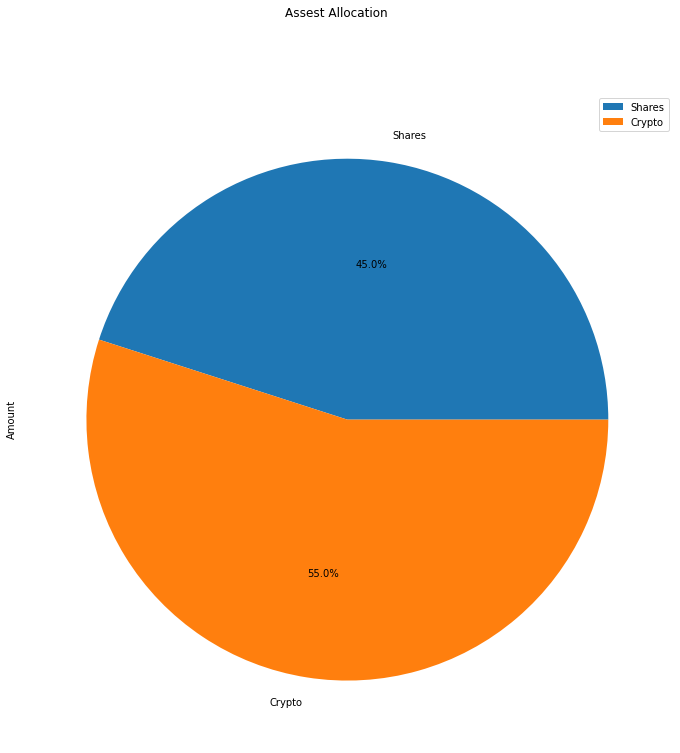

In [33]:
# Plot savings pie chart
# YOUR CODE HERE!
savings_df.plot(kind='pie',
            subplots=True,
            figsize=(12,12),
            title='Assest Allocation',
            autopct='%1.1f%%'
            )

In [36]:
# Set ideal emergency fund
emergency_fund = monthly_income * 3

# Calculate total amount of savings
# YOUR CODE HERE!
total_savings = crypto_val+share_val
# Validate saving health
# YOUR CODE HERE!
# If total savings are greater than the emergency fund, display a message congratulating the person for having enough money in this fund.
if total_savings > emergency_fund:
    print(f'Congradutlations! You  you have {round((total_savings-emergency_fund),2)} in execess of your emergency requirement.')

# If total savings are equal to the emergency fund, display a message congratulating the person on reaching this financial goal.
if total_savings == emergency_fund:
    print(f'Congradutlations! You  you have{round((total_savings),2)} in which meets your emergency requirement.')

# If total savings are less than the emergency fund, display a message showing how many dollars away the person is from reaching the goal.
if total_savings < emergency_fund:
    print(f'warning! You  you have{round((total_savings-emergency_fund),2)} short of your emergency requirement.')



Congradutlations! You  you have 51032.95 in execess of your emergency requirement.


## Part 2 - Retirement Planning

### Monte Carlo Simulation

In [37]:
# Set start and end dates of five years back from today.
# Sample results may vary from the solution based on the time frame chosen
start_date = pd.Timestamp('2015-08-07', tz='America/New_York').isoformat()
end_date = pd.Timestamp('2020-08-07', tz='America/New_York').isoformat()

In [38]:
# Get 5 years' worth of historical data for SPY and AGG
# YOUR CODE HERE!
df_stock_data = alpaca.get_barset(
    tickers,
    timeframe,
    start = start_date,
    end = end_date
).df
# Preview DataFrame
# YOUR CODE HERE!
#df_portfolio.head(10)
# Display sample data
df_stock_data.head()

AGG                                        \
                             open      high      low   close     volume   
time                                                                      
2015-08-07 00:00:00-04:00  109.14  109.2750  109.035  109.21  2041167.0   
2015-08-10 00:00:00-04:00  109.15  109.1700  108.920  109.06  1149778.0   
2015-08-11 00:00:00-04:00  109.42  109.5765  109.284  109.42  1420907.0   
2015-08-12 00:00:00-04:00  109.55  109.7100  109.350  109.36  1468979.0   
2015-08-13 00:00:00-04:00  109.36  109.3651  109.110  109.15  1465173.0   

                              SPY                                     
                             open    high     low   close     volume  
time                                                                  
2015-08-07 00:00:00-04:00  208.16  208.34  206.87  207.93   87669782  
2015-08-10 00:00:00-04:00  209.28  210.67  209.28  210.58   66755890  
2015-08-11 00:00:00-04:00  208.98  209.47  207.76  208.63   88424557  
2015-08-12 00:00:00-04:00  207.11  209.14  205.36  208.89  136171450  
2015-08-13 00:00:00-04:00  208.73  209.55  208.01  208.63   77197796

In [40]:
# Configuring a Monte Carlo simulation to forecast 30 years cumulative returns
# YOUR CODE HERE!
# Configure a Monte Carlo simulation to forecast one year daily returns
MC_Port_1= MCSimulation(
    portfolio_data = df_stock_data,
    num_simulation = 100,
    num_trading_days = 252,
    weights = [.4,.6]
)

In [41]:
# Printing the simulation input data
# YOUR CODE HERE!
MC_Port_1.portfolio_data.head()

AGG                                        \
                             open      high      low   close     volume   
time                                                                      
2015-08-07 00:00:00-04:00  109.14  109.2750  109.035  109.21  2041167.0   
2015-08-10 00:00:00-04:00  109.15  109.1700  108.920  109.06  1149778.0   
2015-08-11 00:00:00-04:00  109.42  109.5765  109.284  109.42  1420907.0   
2015-08-12 00:00:00-04:00  109.55  109.7100  109.350  109.36  1468979.0   
2015-08-13 00:00:00-04:00  109.36  109.3651  109.110  109.15  1465173.0   

                                           SPY                          \
                          daily_return    open    high     low   close   
time                                                                     
2015-08-07 00:00:00-04:00          NaN  208.16  208.34  206.87  207.93   
2015-08-10 00:00:00-04:00    -0.001374  209.28  210.67  209.28  210.58   
2015-08-11 00:00:00-04:00     0.003301  208.98  209.47  207.76  208.63   
2015-08-12 00:00:00-04:00    -0.000548  207.11  209.14  205.36  208.89   
2015-08-13 00:00:00-04:00    -0.001920  208.73  209.55  208.01  208.63   

                                                   
                              volume daily_return  
time                                               
2015-08-07 00:00:00-04:00   87669782          NaN  
2015-08-10 00:00:00-04:00   66755890     0.012745  
2015-08-11 00:00:00-04:00   88424557    -0.009260  
2015-08-12 00:00:00-04:00  136171450     0.001246  
2015-08-13 00:00:00-04:00   77197796    -0.001245

In [42]:
# Running a Monte Carlo simulation to forecast 30 years cumulative returns
# YOUR CODE HERE!
MC_thirty = MCSimulation(
    portfolio_data = df_stock_data,
    weights = [.60,.40],
    num_simulation = 100,
    num_trading_days = 252*30
)

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.


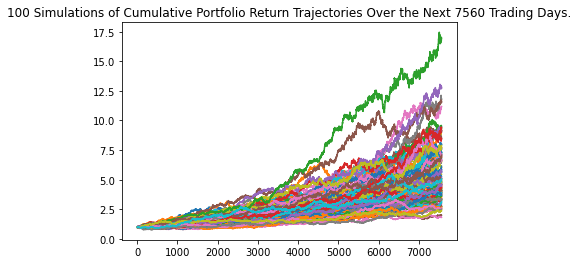

In [43]:
# Plot simulation outcomes
# YOUR CODE HERE!
line_plot = MC_thirty.plot_simulation()

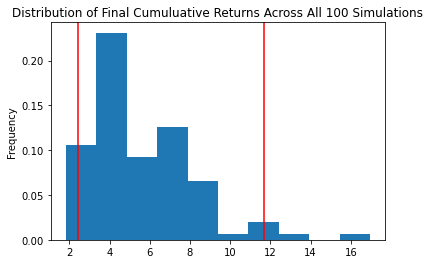

In [44]:
# Plot probability distribution and confidence intervals
# YOUR CODE HERE!
dist_plot = MC_thirty.plot_distribution()

### Retirement Analysis

In [45]:
# Fetch summary statistics from the Monte Carlo simulation results
# YOUR CODE HERE!
table = MC_thirty.summarize_cumulative_return()
# Print summary statistics
# YOUR CODE HERE!
print(table)

count           100.000000
mean              5.593696
std               2.605536
min               1.820835
25%               3.749869
50%               4.818538
75%               7.074362
max              16.964398
95% CI Lower      2.430459
95% CI Upper     11.694785
Name: 7560, dtype: float64


### Calculate the expected portfolio return at the 95% lower and upper confidence intervals based on a `$20,000` initial investment.

In [46]:
# Set initial investment
initial_investment = 20000

# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $20,000
# YOUR CODE HERE!
ci_lower = round(table[8]*initial_investment,2)
ci_upper = round(table[9]*initial_investment,2)
# Print results
print(f"There is a 95% chance that an initial investment of ${initial_investment} in the portfolio"
      f" over the next 30 years will end within in the range of"
      f" ${ci_lower} and ${ci_upper}")

There is a 95% chance that an initial investment of $20000 in the portfolio over the next 30 years will end within in the range of $48609.18 and $233895.7


### Calculate the expected portfolio return at the `95%` lower and upper confidence intervals based on a `50%` increase in the initial investment.

In [47]:
# Set initial investment
initial_investment = 20000 * 1.5

# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $30,000
# YOUR CODE HERE!
ci_lower = round(table[8]*initial_investment,2)
ci_upper = round(table[9]*initial_investment,2)
# Print results
print(f"There is a 95% chance that an initial investment of ${initial_investment} in the portfolio"
      f" over the next 30 years will end within in the range of"
      f" ${ci_lower} and ${ci_upper}")

There is a 95% chance that an initial investment of $30000.0 in the portfolio over the next 30 years will end within in the range of $72913.77 and $350843.55


## Optional Challenge - Early Retirement


### Five Years Retirement Option

In [48]:
# Configuring a Monte Carlo simulation to forecast 5 years cumulative returns
# YOUR CODE HERE!
MC_five = MCSimulation(
    portfolio_data = df_stock_data,
    weights = [.99,.01],
    num_simulation = 100,
    num_trading_days = 252*5
)

In [49]:
# Running a Monte Carlo simulation to forecast 5 years cumulative returns
# YOUR CODE HERE!
table = MC_five.summarize_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.


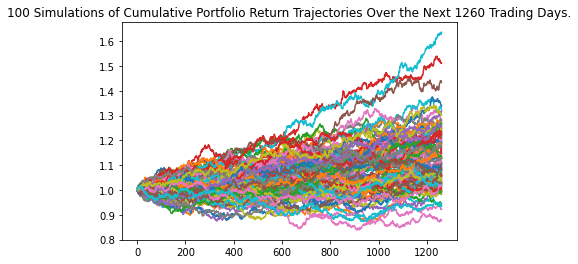

In [50]:
# Plot simulation outcomes
# YOUR CODE HERE!
line_plot = MC_five.plot_simulation()

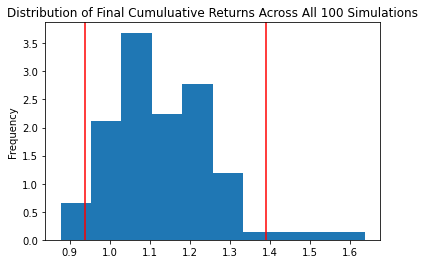

In [51]:
# Plot probability distribution and confidence intervals
# YOUR CODE HERE!
dist_plot = MC_five.plot_distribution()

In [52]:
# Fetch summary statistics from the Monte Carlo simulation results
# YOUR CODE HERE!
table = MC_five.summarize_cumulative_return()
# Print summary statistics
# YOUR CODE HERE!
print(table)

count           100.000000
mean              1.130304
std               0.124784
min               0.877355
25%               1.035147
50%               1.108297
75%               1.217122
max               1.636244
95% CI Lower      0.938611
95% CI Upper      1.388964
Name: 1260, dtype: float64


In [53]:
# Set initial investment
# YOUR CODE HERE!
initial_investment = 20000
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $60,000
# YOUR CODE HERE!
ci_lower_five = round(table[8]*initial_investment,2)
ci_upper_five = round(table[9]*initial_investment,2)
# Print results
print(f"There is a 95% chance that an initial investment of ${initial_investment} in the portfolio"
      f" over the next 5 years will end within in the range of"
      f" ${ci_lower_five} and ${ci_upper_five}")

There is a 95% chance that an initial investment of $20000 in the portfolio over the next 5 years will end within in the range of $18772.23 and $27779.28


### Ten Years Retirement Option

In [54]:
# Configuring a Monte Carlo simulation to forecast 10 years cumulative returns
# YOUR CODE HERE!
MC_ten = MCSimulation(
    portfolio_data = df_stock_data,
    weights = [.9,.1],
    num_simulation = 100,
    num_trading_days = 252*10
)

In [55]:
# Running a Monte Carlo simulation to forecast 10 years cumulative returns
# YOUR CODE HERE!
table = MC_ten.summarize_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.


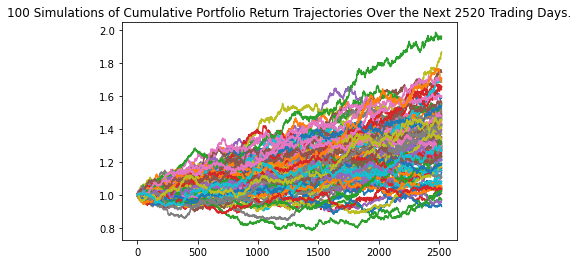

In [56]:
# Plot simulation outcomes
# YOUR CODE HERE!
line_plot = MC_ten .plot_simulation()

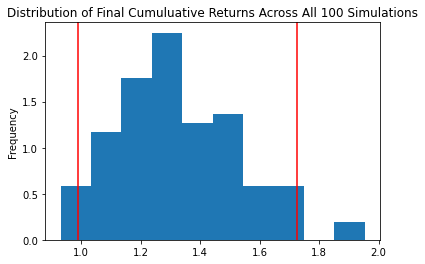

In [57]:
# Plot probability distribution and confidence intervals
# YOUR CODE HERE!
dist_plot = MC_ten.plot_distribution()

In [58]:
# Fetch summary statistics from the Monte Carlo simulation results
# YOUR CODE HERE!
table = MC_ten.summarize_cumulative_return()
# Print summary statistics
# YOUR CODE HERE!

In [59]:
# Set initial investment
# YOUR CODE HERE!
initial_investment = 20000
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $60,000
# YOUR CODE HERE!
ci_lower_ten = round(table[8]*initial_investment,2)
ci_upper_ten = round(table[9]*initial_investment,2)
# Print results
print(f"There is a 95% chance that an initial investment of ${initial_investment} in the portfolio"
      f" over the next 10 years will end within in the range of"
      f" ${ci_lower_ten} and ${ci_upper_ten}")

There is a 95% chance that an initial investment of $20000 in the portfolio over the next 10 years will end within in the range of $19762.37 and $34500.61
